In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

$$\frac{dS}{dt} = -\beta SI,$$
$$\frac{dI}{dt} = \beta SI - \gamma I,$$
$$\frac{dR}{dt} = \gamma I.$$

In [155]:
def z7func(y, t, beta, gamma):
    dS = -beta * y[0] * y[1]
    dR = gamma * y[1]
    dI = -dS - dR
    return (dS, dI, dR)


In [221]:
t0 = 0
tmax = 300
t = np.linspace(t0, tmax, 200)
beta = 0.0002
gamma = 0.04
S0 = 997
I0 = 3
R0 = 0

y = odeint(z7func, (S0, I0, R0), t, args=(beta, gamma))

S = []
I = []
R = []

for sir in y:
    S.append(sir[0])
    I.append(sir[1])
    R.append(sir[2])

Text(0.5, 1.0, 'Recovered population')

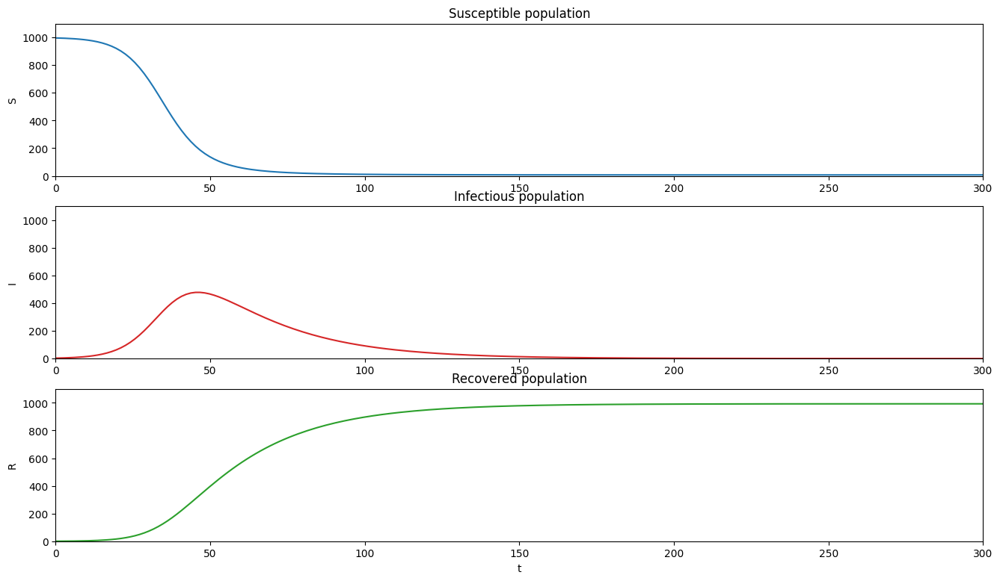

In [222]:
plt.figure(figsize=(16,9))

ax = plt.subplot(311)
ax.plot(t, S, 'C0')
ax.set_xlim(t0, tmax)
ax.set_ylim(0, S0 + I0 + R0 + 100)
# ax.set_xlabel('t')
ax.set_ylabel('S')
ax.set_title('Susceptible population')

ax = plt.subplot(312)
ax.plot(t, I, 'C3')
ax.set_xlim(t0, tmax)
ax.set_ylim(0, S0 + I0 + R0 + 100)
# ax.set_xlabel('t')
ax.set_ylabel('I')
ax.set_title('Infectious population')

ax = plt.subplot(313)
ax.plot(t, R, 'C2')
ax.set_xlim(t0, tmax)
ax.set_ylim(0, S0 + I0 + R0 + 100)
ax.set_xlabel('t')
ax.set_ylabel('R')
ax.set_title('Recovered population')

In [225]:
fig = plt.figure(figsize=(16,9))
ax = plt.subplot()
lineS, lineI, lineR = ax.plot([], [], 'C0', [], [], 'C3', [], [], 'C2')
ax.set_xlim(t0, tmax)
ax.set_ylim(0, S0 + I0 + R0 + 100)
ax.set_xlabel('t')
ax.set_ylabel('S (blue), I (red), R (green)')

plt.close()

def animate(i):
    lineS.set_data(t[:i], S[:i])
    lineI.set_data(t[:i], I[:i])
    lineR.set_data(t[:i], R[:i])

    return lineS, lineI, lineR

anim = FuncAnimation(fig, animate, frames=len(t), interval=30, blit=True)
HTML(anim.to_jshtml())